**Project** **3**

This final project requires launching an adversarial attack on a publicly available deep image classification model, using carefully designed tiny perturbations (almost imperceptible to the human eye) to cause the model to misclassify and thus significantly degrade its performance.

import head files

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import numpy as np
import json
import os
from PIL import Image


**Task 1: Basics**  

 The goal is to attack a ResNet-34 model that is trained to classify the ImageNet-1K
 dataset. ImageNet-1K is a well-known dataset in computer vision research with visually
 challenging images from 1000 classes, and networks which are trained on ImageNet
 typically also do well on other tasks.

In [ ]:
# %cd /content/TestDataSet
%cd /content

!unzip -q TestDataSet.zip

/content


In [ ]:
import torchvision

In [ ]:
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
pretrained_model.eval().cuda()

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 109MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms  = np.array([0.229, 0.224, 0.225])
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

dataset_path = "./TestDataSet"
dataset = torchvision.datasets.ImageFolder(root=dataset_path,
transform=plain_transforms)

batch_size = 32
num_workers = 4
shuffle = False

dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=shuffle,
    num_workers=num_workers,
    pin_memory=True
)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
print(dataset.classes)
print(dataset.class_to_idx)

['n02672831', 'n02676566', 'n02687172', 'n02690373', 'n02692877', 'n02699494', 'n02701002', 'n02704792', 'n02708093', 'n02727426', 'n02730930', 'n02747177', 'n02749479', 'n02769748', 'n02776631', 'n02777292', 'n02782093', 'n02783161', 'n02786058', 'n02787622', 'n02788148', 'n02790996', 'n02791124', 'n02791270', 'n02793495', 'n02794156', 'n02795169', 'n02797295', 'n02799071', 'n02802426', 'n02804414', 'n02804610', 'n02807133', 'n02808304', 'n02808440', 'n02814533', 'n02814860', 'n02815834', 'n02817516', 'n02823428', 'n02823750', 'n02825657', 'n02834397', 'n02835271', 'n02837789', 'n02840245', 'n02841315', 'n02843684', 'n02859443', 'n02860847', 'n02865351', 'n02869837', 'n02870880', 'n02871525', 'n02877765', 'n02879718', 'n02883205', 'n02892201', 'n02892767', 'n02894605', 'n02895154', 'n02906734', 'n02909870', 'n02910353', 'n02916936', 'n02917067', 'n02927161', 'n02930766', 'n02939185', 'n02948072', 'n02950826', 'n02951358', 'n02951585', 'n02963159', 'n02965783', 'n02966193', 'n02966687'

In [ ]:
print(os.listdir("."))           #
print(os.listdir("TestDataSet")) #

['.config', 'TestDataSet', 'TestDataSet.zip', '__MACOSX', 'sample_data']
['n02906734', 'n02883205', 'n03026506', 'n02799071', 'n02910353', 'n02672831', 'n02804414', 'n02804610', 'n03042490', 'n02769748', 'n02966193', 'n02859443', 'n02977058', 'n02687172', 'n03032252', 'n02699494', 'n03016953', 'n02808304', 'n02823428', 'labels_list.json', 'n02951585', 'n02927161', 'n02837789', 'n03017168', 'n02950826', 'n02692877', 'n02788148', 'n02840245', 'n02708093', 'n02999410', 'n02782093', 'n02843684', 'n02749479', 'n02916936', 'n02879718', 'n02835271', 'n02783161', 'n02841315', 'n02823750', 'n02979186', 'n02870880', 'n02817516', 'n02965783', 'n02791124', 'n02895154', '.DS_Store', 'n02892767', 'n02701002', 'n02814533', 'n03000247', 'n02807133', 'n02971356', 'n02877765', 'n02834397', 'n02860847', 'n02808440', 'n02951358', 'n03000684', 'n02790996', 'n02793495', 'n02814860', 'n02777292', 'n02865351', 'n02791270', 'n02815834', 'n02797295', 'n02776631', 'n02894605', 'n02917067', 'n02786058', 'n0293076

In [ ]:
with open("TestDataSet/labels_list.json", "r") as f:
    idx_to_label = json.load(f)

print(idx_to_label[:5], "...")

['401: accordion', '402: acoustic guitar', '403: aircraft carrier', '404: airliner', '405: airship'] ...


In [ ]:
label_map = {}
for item in idx_to_label:
    idx_str, name = item.split(":", 1)
    label_map[int(idx_str.strip())] = name.strip()
label_map

{401: 'accordion',
 402: 'acoustic guitar',
 403: 'aircraft carrier',
 404: 'airliner',
 405: 'airship',
 406: 'altar',
 407: 'ambulance',
 408: 'amphibian',
 409: 'analog clock',
 410: 'apiary',
 411: 'apron',
 412: 'ashcan',
 413: 'assault rifle',
 414: 'backpack',
 415: 'bakery',
 416: 'balance beam',
 417: 'balloon',
 418: 'ballpoint',
 419: 'Band Aid',
 420: 'banjo',
 421: 'bannister',
 422: 'barbell',
 423: 'barber chair',
 424: 'barbershop',
 425: 'barn',
 426: 'barometer',
 427: 'barrel',
 428: 'barrow',
 429: 'baseball',
 430: 'basketball',
 431: 'bassinet',
 432: 'bassoon',
 433: 'bathing cap',
 434: 'bath towel',
 435: 'bathtub',
 436: 'beach wagon',
 437: 'beacon',
 438: 'beaker',
 439: 'bearskin',
 440: 'beer bottle',
 441: 'beer glass',
 442: 'bell cote',
 443: 'bib',
 444: 'bicycle-built-for-two',
 445: 'bikini',
 446: 'binder',
 447: 'binoculars',
 448: 'birdhouse',
 449: 'boathouse',
 450: 'bobsled',
 451: 'bolo tie',
 452: 'bonnet',
 453: 'bookcase',
 454: 'bookshop',

In [ ]:
for item in idx_to_label:
    print(item)

401: accordion
402: acoustic guitar
403: aircraft carrier
404: airliner
405: airship
406: altar
407: ambulance
408: amphibian
409: analog clock
410: apiary
411: apron
412: ashcan
413: assault rifle
414: backpack
415: bakery
416: balance beam
417: balloon
418: ballpoint
419: Band Aid
420: banjo
421: bannister
422: barbell
423: barber chair
424: barbershop
425: barn
426: barometer
427: barrel
428: barrow
429: baseball
430: basketball
431: bassinet
432: bassoon
433: bathing cap
434: bath towel
435: bathtub
436: beach wagon
437: beacon
438: beaker
439: bearskin
440: beer bottle
441: beer glass
442: bell cote
443: bib
444: bicycle-built-for-two
445: bikini
446: binder
447: binoculars
448: birdhouse
449: boathouse
450: bobsled
451: bolo tie
452: bonnet
453: bookcase
454: bookshop
455: bottlecap
456: bow
457: bow tie
458: brass
459: brassiere
460: breakwater
461: breastplate
462: broom
463: bucket
464: buckle
465: bulletproof vest
466: bullet train
467: butcher shop
468: cab
469: caldron
470:

In [ ]:
mapping = [int(item.split(':')[0]) for item in idx_to_label]
mapping

[401,
 402,
 403,
 404,
 405,
 406,
 407,
 408,
 409,
 410,
 411,
 412,
 413,
 414,
 415,
 416,
 417,
 418,
 419,
 420,
 421,
 422,
 423,
 424,
 425,
 426,
 427,
 428,
 429,
 430,
 431,
 432,
 433,
 434,
 435,
 436,
 437,
 438,
 439,
 440,
 441,
 442,
 443,
 444,
 445,
 446,
 447,
 448,
 449,
 450,
 451,
 452,
 453,
 454,
 455,
 456,
 457,
 458,
 459,
 460,
 461,
 462,
 463,
 464,
 465,
 466,
 467,
 468,
 469,
 470,
 471,
 472,
 473,
 474,
 475,
 476,
 477,
 478,
 479,
 480,
 481,
 482,
 483,
 484,
 485,
 486,
 487,
 488,
 489,
 490,
 491,
 492,
 493,
 494,
 495,
 496,
 497,
 498,
 499,
 500]

In [ ]:
def compute_accuracy(model, dataloader, device="cuda"):
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    with torch.no_grad():
        for inputs, folder_idxs in dataloader:
            inputs = inputs.to(device)

            true_labels = torch.tensor(
                [mapping[idx] for idx in folder_idxs],
                device=device
            )

            outputs = model(inputs)

            # Top-1
            _, pred1 = outputs.max(1)
            correct_top1 += (pred1 == true_labels).sum().item()

            # Top-5
            _, top5 = outputs.topk(5, dim=1)

            for i in range(inputs.size(0)):
                if true_labels[i].item() in top5[i].tolist():
                    correct_top5 += 1

            total += inputs.size(0)

    top1_accuracy = 100 * correct_top1 / total
    top5_accuracy = 100 * correct_top5 / total

    return top1_accuracy, top5_accuracy

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pretrained_model = pretrained_model.to(device)

# acc
original_top1, original_top5 = compute_accuracy(pretrained_model, dataloader, device)

# result
print(f"original Top-1: {original_top1:.2f}%")
print(f"original Top-5: {original_top5:.2f}%")

original Top-1: 76.00%
original Top-5: 94.20%


**Task 2: Pixel-wise attacks**  

A common and simple algorithm for mounting an L∞ attack is called Fast Gradient
Sign Method (FGSM); this implements a single step of gradient ascent (in pixel space)
and truncates the values of the gradients to at most .

In [ ]:
epsilon = 0.02

mean = torch.from_numpy(mean_norms).float().view(1, 3, 1, 1).to(device)
std  = torch.from_numpy(std_norms).float().view(1, 3, 1, 1).to(device)

def fgsm_attack(image, epsilon, data_grad):

    sign_grad = data_grad.sign()


    scaled_eps = epsilon / std   #

    #
    raw_pert = image + scaled_eps * sign_grad
    delta = raw_pert - image

    delta_clipped = torch.clamp(delta, -scaled_eps, scaled_eps)
    pert = image + delta_clipped

    #
    lower = (0.0 - mean) / std
    upper = (1.0 - mean) / std
    pert = torch.max(torch.min(pert, upper), lower)

    return pert

In [ ]:
def generate_adversarial_dataset(model, dataloader, epsilon, device, save_dir):

    model.eval()
    os.makedirs(save_dir, exist_ok=True)
    adv_images = []
    adv_labels = []
    orig_images = []
    orig_labels = []

    for i, (inputs, folder_idxs) in enumerate(dataloader):
        inputs, folder_idxs = inputs.to(device), folder_idxs.to(device)

        orig_inputs = inputs.clone().detach()
        orig_images.append(orig_inputs.cpu())
        # mapping
        true_labels = torch.tensor([mapping[idx.item()] for idx in folder_idxs], device=device)
        orig_labels.append(true_labels.cpu())


        inputs.requires_grad = True
        outputs = model(inputs)
        loss = F.cross_entropy(outputs, true_labels)
        model.zero_grad()
        loss.backward()

        # get grad and use perturbed
        data_grad = inputs.grad.data
        perturbed = fgsm_attack(inputs, epsilon, data_grad)

        # get the max perturbed
        max_scaled_eps = torch.min(1.0 / std)
        delta = torch.max(torch.abs(perturbed - inputs), dim=1)[0]
        assert torch.all(delta <= max_scaled_eps + 1e-6), "Normalized L-inf error ε"

        #
        adv_images.append(perturbed.detach().cpu())
        adv_labels.append(true_labels.cpu())

    orig_images = torch.cat(orig_images, dim=0)
    orig_labels = torch.cat(orig_labels, dim=0)
    adv_images = torch.cat(adv_images, dim=0)
    adv_labels = torch.cat(adv_labels, dim=0)


    torch.save({
        'orig_images': orig_images,
        'orig_labels': orig_labels,
        'adv_images' : adv_images,
        'adv_labels' : adv_labels
    }, os.path.join(save_dir, "adversarial_testset1.pt"))
    return orig_images, orig_labels, adv_images, adv_labels


In [ ]:
save_dir = "./Adversarial_TestSet1"
ss,sss,adv_images, adv_labels = generate_adversarial_dataset(
    pretrained_model, dataloader, epsilon, device="cuda", save_dir=save_dir
)

In [ ]:
def evaluate_adversarial_dataset(model, adv_images, adv_labels, batch_size=32, device="cuda"):
    """

    """
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = adv_images.size(0)

    with torch.no_grad():
        for start in range(0, total, batch_size):
            end = min(start + batch_size, total)
            inputs = adv_images[start:end].to(device).float()
            labels = adv_labels[start:end].to(device)

            outputs = model(inputs)  # [batch, num_classes]

            # Top-1
            _, pred1 = outputs.max(dim=1)
            correct_top1 += (pred1 == labels).sum().item()

            # Top-5
            _, top5 = outputs.topk(5, dim=1, largest=True, sorted=True)

            for i in range(inputs.size(0)):
                if labels[i].item() in top5[i].tolist():
                    correct_top5 += 1

    top1_acc = 100.0 * correct_top1 / total
    top5_acc = 100.0 * correct_top5 / total
    return top1_acc, top5_acc


In [ ]:
# acc
Orignal_FGSM_top1, Orignal_FGSM_top5 = evaluate_adversarial_dataset(
    pretrained_model, adv_images, adv_labels, batch_size=32, device="cuda"
)
print(f"Top-1 after FGSM Accuracy: {Orignal_FGSM_top1:.2f}%")
print(f"Top-5 after FGSM Accuracy: {Orignal_FGSM_top5:.2f}%")

Top-1 after FGSM Accuracy: 3.40%
Top-5 after FGSM Accuracy: 21.20%


In [ ]:
import torch
import torch.nn.functional as F

def show_topk_adversarial(model, images, labels, device="cuda", k=5):
    """

    """
    model.eval()
    imgs = images[:k].to(device).float()
    labs = labels[:k]

    with torch.no_grad():
        outputs = model(imgs)               # [k, num_classes]
        probs   = F.softmax(outputs, dim=1) # [k, num_classes]
        topk_probs, topk_idxs = probs.topk(k, dim=1)  # [k, k]

    results = []
    for i in range(k):
        true_idx  = labs[i].item()
        true_name = label_map.get(true_idx, f"Class {true_idx}")
        print(f"=== Sample {i+1} (True Label: {true_name}) ===")
        sample_res = []
        for rank, (idx_tensor, prob) in enumerate(zip(topk_idxs[i], topk_probs[i]), 1):
            pred_idx  = idx_tensor.item()
            pred_name = label_map.get(pred_idx, f"Class {pred_idx}")
            pct = prob.item() * 100
            print(f"{rank}. {pred_name:>20s} — {pct:6.2f}%")
            sample_res.append((pred_idx, pred_name, pct))
        print()
        results.append(sample_res)

    return results




In [ ]:
res = show_topk_adversarial(pretrained_model, adv_images, adv_labels, device="cuda", k=5)


=== Sample 1 (True Label: accordion) ===
1.            accordion —  12.06%
2.            Class 621 —   4.61%
3.            Class 579 —   2.68%
4.            amphibian —   2.65%
5.             baseball —   2.25%

=== Sample 2 (True Label: accordion) ===
1.            Class 753 —  27.71%
2.            Class 811 —   7.92%
3.            Class 886 —   7.36%
4.            Class 686 —   3.98%
5.                broom —   3.11%

=== Sample 3 (True Label: accordion) ===
1.            Class 819 —  94.57%
2.            Class 854 —   3.89%
3.            Class 818 —   0.75%
4.            Class 862 —   0.44%
5.               cinema —   0.09%

=== Sample 4 (True Label: accordion) ===
1.            Class 772 —  39.98%
2.            Class 584 —  13.57%
3.            Class 784 —   2.40%
4.      carpenter's kit —   2.23%
5.            Class 692 —   2.15%

=== Sample 5 (True Label: accordion) ===
1.            Class 398 —  60.33%
2.            Class 800 —  30.25%
3.            Class 754 —   4.89%
4.       

In [ ]:
# def display_adversarial_and_original_samples(pt_path, mean_norms, std_norms, k=5):

#     data = torch.load(pt_path)
#     orig_images = data['orig_images']  # (N, C, H, W)
#     orig_labels = data['orig_labels']
#     adv_images  = data['adv_images']
#     adv_labels  = data['adv_labels']


#     mean = torch.tensor(mean_norms).view(1, 3, 1, 1)
#     std  = torch.tensor(std_norms).view(1, 3, 1, 1)


#     n = min(k, orig_images.size(0), adv_images.size(0))

#     for i in range(n):

#         orig = (orig_images[i:i+1] * std + mean) \
#                .clamp(0,1).squeeze(0).permute(1,2,0).cpu().numpy()
#         adv  = (adv_images[i:i+1]  * std + mean) \
#                .clamp(0,1).squeeze(0).permute(1,2,0).cpu().numpy()


#         raw_noise = adv - orig


#         norm_noise = (raw_noise - raw_noise.min()) / (raw_noise.max() - raw_noise.min() + 1e-8)


#         fig, axes = plt.subplots(1, 3, figsize=(12, 4))

#         axes[0].imshow(orig)
#         axes[0].set_title(f"Original #{i+1}\nLabel: {orig_labels[i].item()}")
#         axes[0].axis('off')

#         axes[1].imshow(adv)
#         axes[1].set_title(f"Adversarial #{i+1}\nLabel: {adv_labels[i].item()}")
#         axes[1].axis('off')

#         axes[2].imshow(norm_noise)
#         axes[2].set_title("Normalized Noise\n(adv - orig)")
#         axes[2].axis('off')

#         plt.tight_layout()
#         plt.show()


In [ ]:
def display_adversarial_and_original_with_top5(
    model,
    pt_path,
    label_map,
    device="cuda",
    mean_norms=(0.485,0.456,0.406),
    std_norms=(0.229,0.224,0.225),
    k=5
):

    data = torch.load(pt_path, map_location="cpu")
    orig_images = data['orig_images']  # (N, C, H, W)
    orig_labels = data['orig_labels']
    adv_images  = data['adv_images']
    adv_labels  = data['adv_labels']


    mean = torch.tensor(mean_norms).view(1,3,1,1)
    std  = torch.tensor(std_norms).view(1,3,1,1)

    model.eval()
    n = min(k, orig_images.size(0), adv_images.size(0))
    for i in range(n):

        orig = (orig_images[i:i+1] * std + mean) \
               .clamp(0,1).squeeze(0).permute(1,2,0).cpu().numpy()

        adv  = (adv_images[i:i+1]  * std + mean) \
               .clamp(0,1).squeeze(0).permute(1,2,0).cpu().numpy()

        raw_noise = adv - orig
        norm_noise = (raw_noise - raw_noise.min()) / (raw_noise.max() - raw_noise.min() + 1e-8)

        orig_idx  = orig_labels[i].item()
        orig_name = label_map.get(orig_idx, f"Class {orig_idx}")

        inp = adv_images[i:i+1].to(device).float()
        with torch.no_grad():
            logits = model(inp)
            probs  = F.softmax(logits, dim=1)[0]        # (num_classes,)
            top5_p, top5_idx = probs.topk(5)           # (5,), (5,)
        top5_p = top5_p.cpu().numpy() * 100.0         #
        top5_idx = top5_idx.cpu().numpy()
        top5_names = [label_map.get(int(idx), f"Class {int(idx)}") for idx in top5_idx]


        fig, axes = plt.subplots(1, 4, figsize=(16, 4))

        axes[0].imshow(orig)
        axes[0].set_title(f"Original #{i+1}\nLabel: {orig_name}")
        axes[0].axis('off')

        axes[1].imshow(adv)
        axes[1].set_title(f"Adversarial #{i+1}\n")
        axes[1].axis('off')

        axes[2].imshow(norm_noise)
        axes[2].set_title("Normalized Noise")
        axes[2].axis('off')

        y_pos = np.arange(5)
        axes[3].barh(y_pos, top5_p[::-1])
        axes[3].set_yticks(y_pos)
        axes[3].set_yticklabels(top5_names[::-1])
        axes[3].set_xlabel("Confidence (%)")
        axes[3].set_title("Top-5 Predictions")
        axes[3].grid(True, axis='x', linestyle='--', linewidth=0.8, alpha=0.7)
        axes[3].grid(True, axis='y', linestyle='--', linewidth=0.8, alpha=0.7)

        plt.tight_layout()
        plt.show()


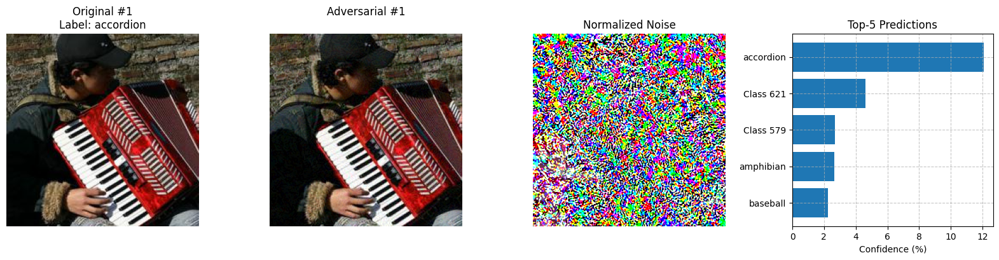

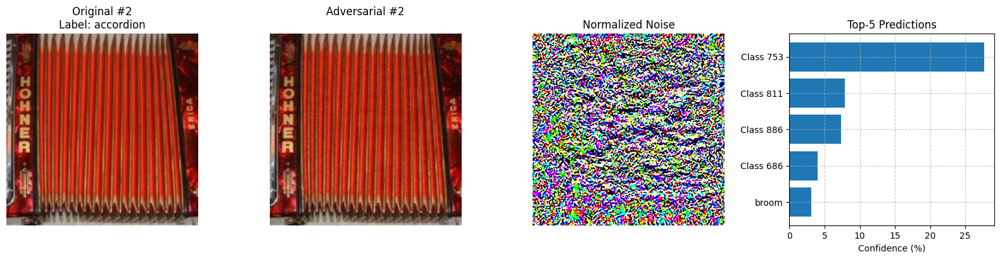

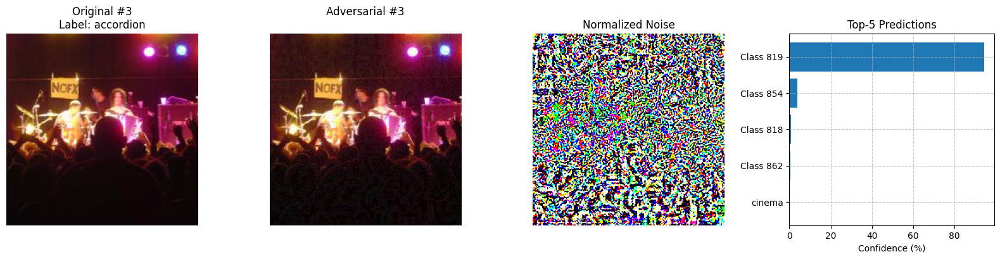

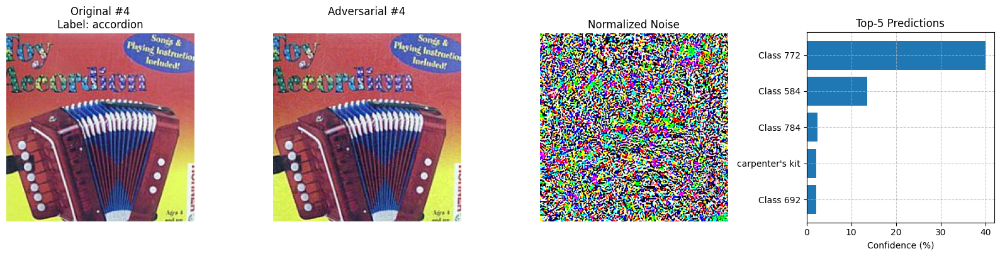

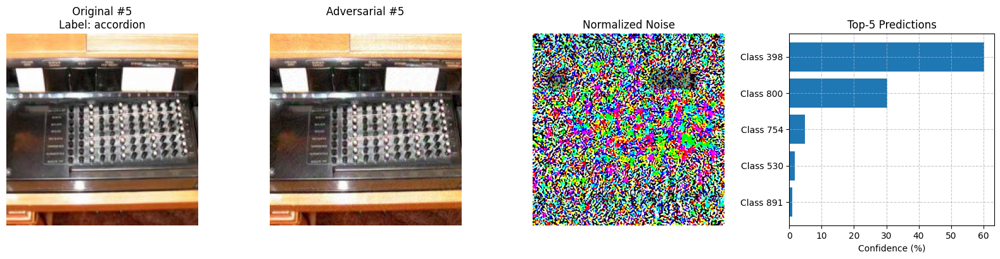

In [ ]:
mean_norms1 = [0.485, 0.456, 0.406]
std_norms1  = [0.229, 0.224, 0.225]
display_adversarial_and_original_with_top5(
    model=pretrained_model,
    pt_path="Adversarial_TestSet1/adversarial_testset1.pt",
    label_map=label_map,
    device="cuda",
    mean_norms=mean_norms1,
    std_norms=std_norms1,
    k=5
)



**Task 3: Improved attacks**  
Now that you have two accuracy metrics (one for the original test set, Adversarial Test
Set 1), propose ways to improve your attack and degrade performance even further.
Remember: you can do whatever you like to the original test images, as long as the ε
constraint is met and you get worse performance than FGSM. Options include: multiple
gradient steps, targeted attacks, other optimizers, etc.      

You should now have a new set of 500 images; verify that the new images are visually
similar to the original test set and that the L∞ distance between new and original is no
greater than ε = 0.02. Save this dataset (call this “Adversarial Test Set 2”). Visualize
performance for 3-5 example images. Evaluate ResNet-34 performance and report new
top-1 and top-5 accuracy scores. You should strive to achieve accuracy drop of at least
70% relative to your baseline numbers from Task 1.

In [ ]:
# This function implements the PGD (Projected Gradient Descent) attack, which performs multiple steps of gradient ascent
def pgd_attack(image, label, model, epsilon, alpha, num_iter, mean, std):
    perturbed = image.clone().detach().to(image.device)
    perturbed.requires_grad = True

    for _ in range(num_iter):
        outputs = model(perturbed)
        loss = F.cross_entropy(outputs, label)
        model.zero_grad()
        loss.backward()

        # Take the sign of the gradient to get the direction of maximum loss increase
        sign_grad = perturbed.grad.data.sign()
        scaled_alpha = alpha / std
        # Apply one step of the perturbation in the direction of the gradient
        perturbed = perturbed + scaled_alpha * sign_grad

        # Project total perturbation back into the normalized space
        delta = torch.clamp(perturbed - image, min=-epsilon / std, max=epsilon / std)
        perturbed = image + delta

        # Project the perturbed image back into the valid pixel range
        lower = (0.0 - mean) / std
        upper = (1.0 - mean) / std
        perturbed = torch.max(torch.min(perturbed, upper), lower)

        perturbed = perturbed.detach()
        perturbed.requires_grad = True

    return perturbed

In [ ]:
def generate_stronger_adversarial_dataset(model, dataloader, epsilon, alpha, num_iter, device, save_dir):
    model.eval()
    os.makedirs(save_dir, exist_ok=True)

    # Lists to store adversarial and original images/labels
    adv_images = []
    adv_labels = []
    orig_images = []
    orig_labels = []

    for i, (inputs, folder_idxs) in enumerate(dataloader):
        # Move data to the correct device and convert inputs to float32
        inputs, folder_idxs = inputs.to(device).float(), folder_idxs.to(device)

        orig_inputs = inputs.clone().detach()
        orig_images.append(orig_inputs.cpu())

        # Map ImageFolder indices to true ImageNet class indices
        true_labels = torch.tensor([mapping[idx.item()] for idx in folder_idxs], device=device)
        orig_labels.append(true_labels.cpu())

        # Apply PGD attack to each image individually
        batch_adv = []
        for j in range(inputs.size(0)):
            adv = pgd_attack(
                image=inputs[j:j+1],
                label=true_labels[j:j+1],
                model=model,
                epsilon=epsilon,
                alpha=alpha,
                num_iter=num_iter,
                mean=mean,
                std=std
            )
            batch_adv.append(adv.detach().cpu())

        adv_images.append(torch.cat(batch_adv, dim=0))
        adv_labels.append(true_labels.cpu())

    # Concatenate all batches into single tensors
    orig_images = torch.cat(orig_images, dim=0)
    orig_labels = torch.cat(orig_labels, dim=0)
    adv_images = torch.cat(adv_images, dim=0)
    adv_labels = torch.cat(adv_labels, dim=0)

    torch.save({
        'orig_images': orig_images,
        'orig_labels': orig_labels,
        'adv_images' : adv_images,
        'adv_labels' : adv_labels
    }, os.path.join(save_dir, "adversarial_testset2.pt"))

    return orig_images, orig_labels, adv_images, adv_labels

In [ ]:
# parameters used for pgd attack
epsilon = 0.02
alpha = 0.005
num_iter = 10

mean = torch.from_numpy(mean_norms).float().view(1, 3, 1, 1).to(device)
std  = torch.from_numpy(std_norms).float().view(1, 3, 1, 1).to(device)

# Perform pgd attack
save_dir = "./Adversarial_TestSet2"
orig_imgs, orig_lbls, adv_imgs, adv_lbls = generate_stronger_adversarial_dataset(
    model=pretrained_model,
    dataloader=dataloader,
    epsilon=epsilon,
    alpha=alpha,
    num_iter=num_iter,
    device=device,
    save_dir=save_dir
)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
# Load the data
data = torch.load("Adversarial_TestSet2/adversarial_testset2.pt", map_location="cpu")
adv_images = data['adv_images']
adv_labels = data['adv_labels']

# evaluate the result
pgd_top1, pgd_top5 = evaluate_adversarial_dataset(
    pretrained_model, adv_images, adv_labels, batch_size=32, device="cuda"
)

print(f"[PGD] Top-1 Accuracy: {pgd_top1:.2f}%")
print(f"[PGD] Top-5 Accuracy: {pgd_top5:.2f}%")

[PGD] Top-1 Accuracy: 0.00%
[PGD] Top-5 Accuracy: 1.40%


In [ ]:
show_topk_adversarial(pretrained_model, adv_images, adv_labels, device="cuda", k=5)

=== Sample 1 (True Label: accordion) ===
1.            Class 595 —  96.39%
2.            Class 856 —   3.35%
3.            Class 621 —   0.19%
4.            Class 866 —   0.07%
5.            Class 730 —   0.00%

=== Sample 2 (True Label: accordion) ===
1.            Class 753 — 100.00%
2.            Class 811 —   0.00%
3.            Class 807 —   0.00%
4.                chime —   0.00%
5.            Class 581 —   0.00%

=== Sample 3 (True Label: accordion) ===
1.            Class 819 — 100.00%
2.            Class 854 —   0.00%
3.               cinema —   0.00%
4.            Class 781 —   0.00%
5.            Class 598 —   0.00%

=== Sample 4 (True Label: accordion) ===
1.            Class 772 — 100.00%
2.      carpenter's kit —   0.00%
3.            Class 584 —   0.00%
4.            Class 784 —   0.00%
5.            Class 840 —   0.00%

=== Sample 5 (True Label: accordion) ===
1.            Class 398 — 100.00%
2.            Class 543 —   0.00%
3.            Class 922 —   0.00%
4.       

[[(595, 'Class 595', 96.38601541519165),
  (856, 'Class 856', 3.347531333565712),
  (621, 'Class 621', 0.19120164215564728),
  (866, 'Class 866', 0.07369398954324424),
  (730, 'Class 730', 0.0006059641691535944)],
 [(753, 'Class 753', 100.0),
  (811, 'Class 811', 2.0862536143084753e-07),
  (807, 'Class 807', 1.0795672134022993e-07),
  (494, 'chime', 3.209953969296464e-08),
  (581, 'Class 581', 2.4466337289474893e-08)],
 [(819, 'Class 819', 99.99978542327881),
  (854, 'Class 854', 0.00020977518033760134),
  (498, 'cinema', 3.9966312925798775e-06),
  (781, 'Class 781', 1.99325942418227e-06),
  (598, 'Class 598', 1.8419662239921308e-06)],
 [(772, 'Class 772', 100.0),
  (477, "carpenter's kit", 2.6927862717407436e-08),
  (584, 'Class 584', 2.4294977141181562e-08),
  (784, 'Class 784', 1.086003995065532e-08),
  (840, 'Class 840', 5.783840767437098e-09)],
 [(398, 'Class 398', 100.0),
  (543, 'Class 543', 2.6750263974268306e-13),
  (922, 'Class 922', 2.2978328851355973e-13),
  (494, 'chime', 

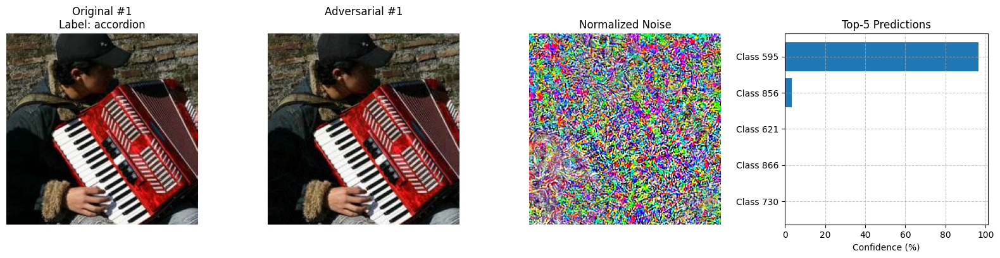

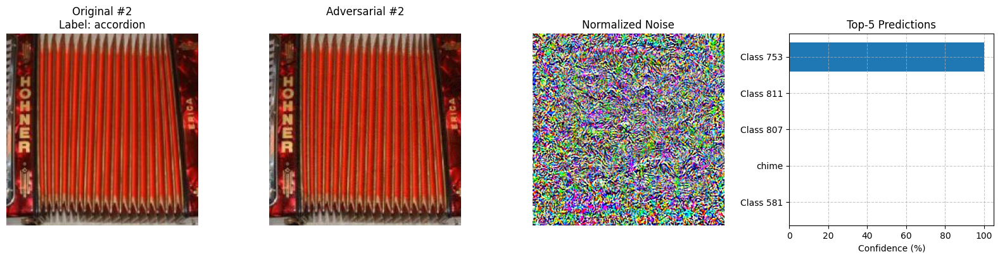

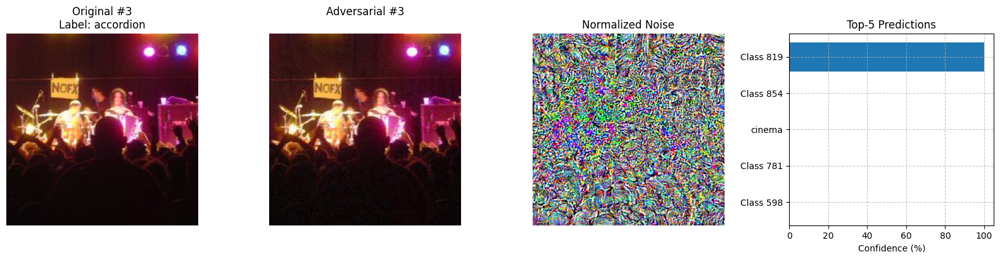

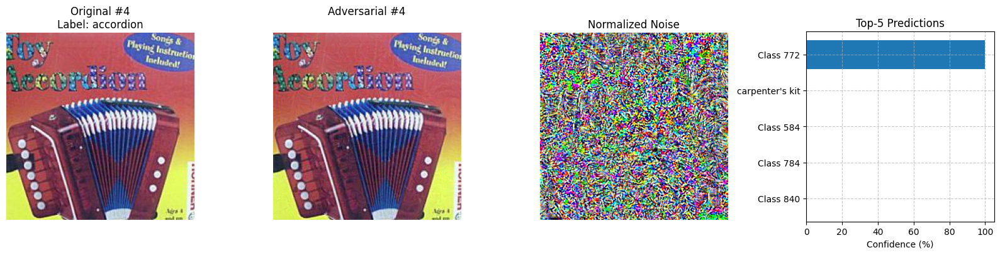

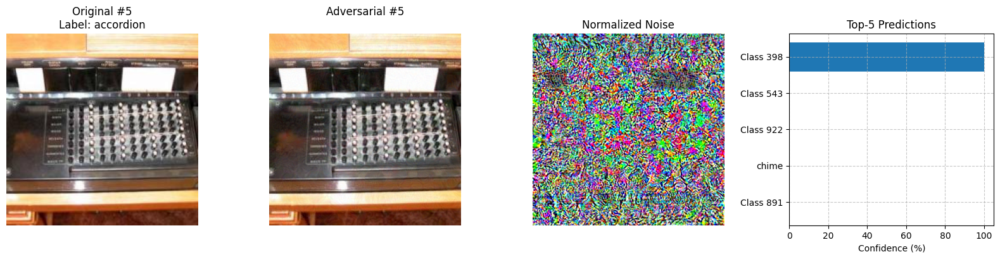

In [ ]:
display_adversarial_and_original_with_top5(
    model=pretrained_model,
    pt_path="Adversarial_TestSet2/adversarial_testset2.pt",
    label_map=label_map,
    device="cuda",
    mean_norms=mean_norms1,
    std_norms=std_norms1,
    k=5
)

**Task 4: Patch attacks**  

Pick your best performing attack method so far, but now implement it such that you
aren’t perturbing the whole test image, but only a small random patch of size 32x32.
This is going to be more challenging, since as the attacker you have fewer knobs to
twiddle around. Therefore you are free to increase ε to a much larger amount (say 0.3
or even 0.5) to make your attack work. Hint: a targeted attack might be helpful in this
context.
You should now have a new set of 500 images. Save this dataset (call this “Adversarial
Test Set 3”). Visualize performance for 3-5 example images. Evaluate ResNet-34
performance and report new top-1 and top-5 accuracy scores.

In [ ]:
import random
def pgd_patch_attack(image, label, model, epsilon, alpha, num_iter, mean, std, patch_size=32):
    model.eval()

    perturbed = image.clone().detach().to(image.device)
    perturbed.requires_grad = True

    _, _, H, W = perturbed.shape

    # Randomly choose the top-left corner of the patch
    top = random.randint(0, H - patch_size)
    left = random.randint(0, W - patch_size)

    original_patch = image[:, :, top:top+patch_size, left:left+patch_size]

    # Perform multiple gradient steps
    for _ in range(num_iter):
        outputs = model(perturbed)
        loss = F.cross_entropy(outputs, label)
        model.zero_grad()
        loss.backward()

        # Get the sign of the gradient
        grad_sign = perturbed.grad.data.sign()
        # Scale the update step
        scaled_alpha = alpha / std

        with torch.no_grad():
          # Extract the 32x32 patch and corresponding gradient
          perturbed_patch = perturbed[:, :, top:top+patch_size, left:left+patch_size]
          grad_patch = grad_sign[:, :, top:top+patch_size, left:left+patch_size]

          # Apply perturbation only within the patch
          perturbed_patch = perturbed_patch + scaled_alpha * grad_patch

          # Project perturbation within the bound
          delta = perturbed_patch - original_patch
          delta = torch.clamp(delta, min=-epsilon / std, max=epsilon / std)
          perturbed_patch = original_patch + delta

          # Clone the full image and update the patch region
          perturbed = perturbed.clone()
          perturbed[:, :, top:top+patch_size, left:left+patch_size] = perturbed_patch

          lower = (0.0 - mean) / std
          upper = (1.0 - mean) / std
          perturbed = torch.max(torch.min(perturbed, upper), lower)

          perturbed = perturbed.detach()
          perturbed.requires_grad = True

    return perturbed

In [ ]:
def generate_patch_adversarial_dataset(model, dataloader, epsilon, alpha, num_iter, device, save_dir):
    model.eval()
    os.makedirs(save_dir, exist_ok=True)
    adv_images, adv_labels = [], []
    orig_images, orig_labels = [], []

    for inputs, folder_idxs in dataloader:
        inputs, folder_idxs = inputs.to(device).float(), folder_idxs.to(device)

        true_labels = torch.tensor([mapping[idx.item()] for idx in folder_idxs], device=device)
        orig_images.append(inputs.cpu())
        orig_labels.append(true_labels.cpu())

        # Apply patch-based PGD attack
        batch_adv = []
        for i in range(inputs.size(0)):
            adv = pgd_patch_attack(
                image=inputs[i:i+1],
                label=true_labels[i:i+1],
                model=model,
                epsilon=epsilon,
                alpha=alpha,
                num_iter=num_iter,
                mean=mean,
                std=std
            )
            batch_adv.append(adv.detach().cpu())

        adv_images.append(torch.cat(batch_adv, dim=0))
        adv_labels.append(true_labels.cpu())

    orig_images = torch.cat(orig_images, dim=0)
    orig_labels = torch.cat(orig_labels, dim=0)
    adv_images = torch.cat(adv_images, dim=0)
    adv_labels = torch.cat(adv_labels, dim=0)

    torch.save({
        'orig_images': orig_images,
        'orig_labels': orig_labels,
        'adv_images' : adv_images,
        'adv_labels' : adv_labels
    }, os.path.join(save_dir, "adversarial_testset3.pt"))

    return orig_images, orig_labels, adv_images, adv_labels

In [ ]:
epsilon = 0.5
alpha = 0.05
num_iter = 10

save_dir = "./Adversarial_TestSet3"

orig_imgs, orig_lbls, adv_imgs, adv_lbls = generate_patch_adversarial_dataset(
    model=pretrained_model,
    dataloader=dataloader,
    epsilon=epsilon,
    alpha=alpha,
    num_iter=num_iter,
    device="cuda",
    save_dir=save_dir
)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
patch_top1, patch_top5 = evaluate_adversarial_dataset(pretrained_model, adv_imgs, adv_lbls, batch_size=32, device="cuda")
print(f"[Patch PGD] Top-1 Accuracy: {patch_top1:.2f}%")
print(f"[Patch PGD] Top-5 Accuracy: {patch_top5:.2f}%")

[Patch PGD] Top-1 Accuracy: 30.00%
[Patch PGD] Top-5 Accuracy: 69.20%


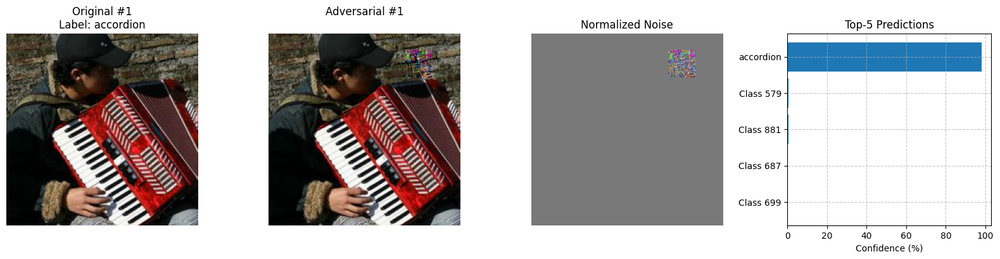

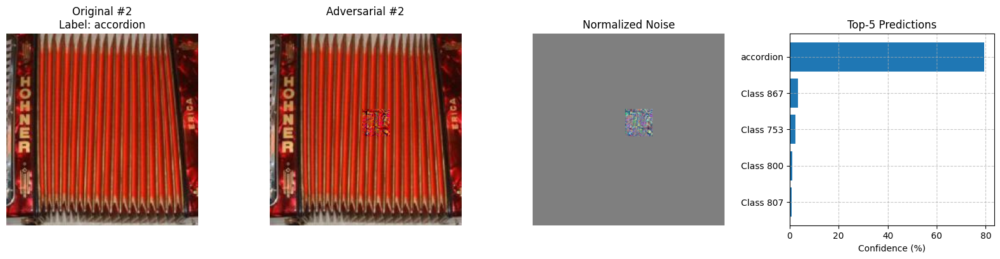

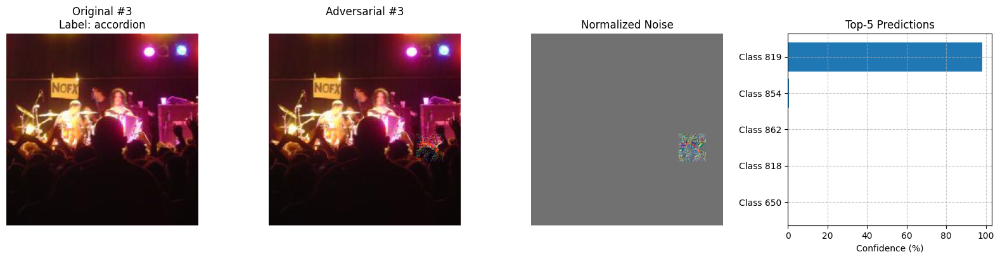

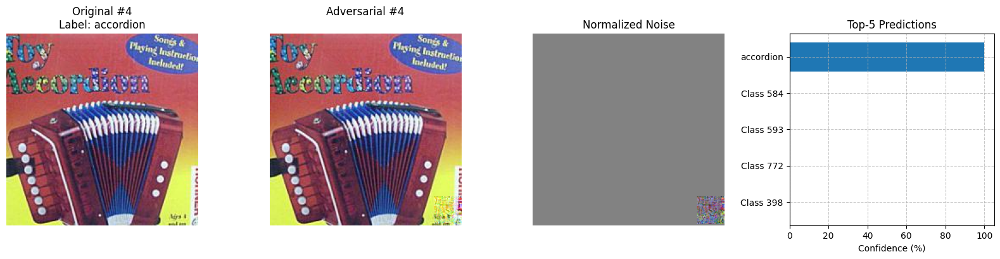

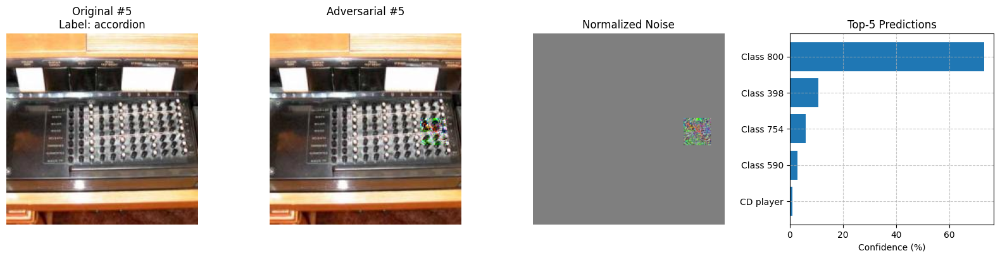

In [ ]:
# Visualization
display_adversarial_and_original_with_top5(
    model=pretrained_model,
    pt_path="Adversarial_TestSet3/adversarial_testset3.pt",
    label_map=label_map,
    device="cuda",
    mean_norms=mean_norms1,
    std_norms=std_norms1,
    k=5
)

**Task 5: Transferring attacks**

You now have three perturbed versions of the original test set. Evaluate classification
accuracy of these datasets using any pre-trained network other than ResNet-34. You can
choose any model you like; for example, DenseNet-121

In [ ]:
# We choose densenet121 to test
new_model = torchvision.models.densenet121(weights='IMAGENET1K_V1')
new_model = new_model.eval().to("cuda")

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 180MB/s]


In [ ]:
# Load the four dataset
dataset_paths = {
    "Original": "Adversarial_TestSet1/adversarial_testset1.pt",
    "FGSM":     "Adversarial_TestSet1/adversarial_testset1.pt",
    "PGD":      "Adversarial_TestSet2/adversarial_testset2.pt",
    "Patch":    "Adversarial_TestSet3/adversarial_testset3.pt"
}

results = {}

In [ ]:
# evaluate them one by one
for name, path in dataset_paths.items():
    data = torch.load(path, map_location="cpu")

    if name == "Original":
        images = data['orig_images']
        labels = data['orig_labels']
    else:
        images = data['adv_images']
        labels = data['adv_labels']

    top1, top5 = evaluate_adversarial_dataset(new_model, images, labels, device="cuda")
    results[name] = (top1, top5)

In [ ]:
results_orignal = {
    "Original": (original_top1, original_top5),
    "FGSM":     (Orignal_FGSM_top1, Orignal_FGSM_top5),
    "PGD":      (pgd_top1, pgd_top5),
    "Patch":    (patch_top1, patch_top5)
}

In [ ]:
# print out their performance
print("Transfer Attack Results on DenseNet-121")
print(f"{'Dataset':<10} | {'Top-1 (%)':>10} | {'Top-5 (%)':>10}")
print("-" * 35)
for name, (top1, top5) in results.items():
    print(f"{name:<10} | {top1:10.2f} | {top5:10.2f}")
print("-" * 35)
print("-" * 35)




Transfer Attack Results on DenseNet-121
Dataset    |  Top-1 (%) |  Top-5 (%)
-----------------------------------
Original   |      74.80 |      93.60
FGSM       |      45.80 |      76.20
PGD        |      40.60 |      77.00
Patch      |      67.80 |      89.80
-----------------------------------
-----------------------------------


In [ ]:
print("Transfer Attack Results on ImageNet-1K")
print(f"{'Dataset':<10} | {'Top-1 (%)':>10} | {'Top-5 (%)':>10}")
print("-" * 35)
for name, (top1, top5) in results_orignal.items():
    print(f"{name:<10} | {top1:10.2f} | {top5:10.2f}")
print("-" * 35)
print("-" * 35)

# print out their performance
print("Transfer Attack Results on DenseNet-121")
print(f"{'Dataset':<10} | {'Top-1 (%)':>10} | {'Top-5 (%)':>10}")
print("-" * 35)
for name, (top1, top5) in results.items():
    print(f"{name:<10} | {top1:10.2f} | {top5:10.2f}")
print("-" * 35)
print("-" * 35)




Transfer Attack Results on ImageNet-1K
Dataset    |  Top-1 (%) |  Top-5 (%)
-----------------------------------
Original   |      76.00 |      94.20
FGSM       |       3.40 |      21.20
PGD        |       0.00 |       1.40
Patch      |      30.00 |      69.20
-----------------------------------
-----------------------------------
Transfer Attack Results on DenseNet-121
Dataset    |  Top-1 (%) |  Top-5 (%)
-----------------------------------
Original   |      74.80 |      93.60
FGSM       |      45.80 |      76.20
PGD        |      40.60 |      77.00
Patch      |      67.80 |      89.80
-----------------------------------
-----------------------------------
